In [1]:
import Pkg; Pkg.add("DifferentialEquations")
import Pkg; Pkg.add("Plots")
import Pkg; Pkg.add("Formatting")
import Pkg; Pkg.add("Catalyst")
import Pkg; Pkg.add("Noise")
import Pkg; Pkg.add("LinearAlgebra")
import Pkg; Pkg.add("Latexify")
import Pkg; Pkg.add("ModelingToolkit")
import Pkg; Pkg.add("PlotlyJS")
import Pkg; Pkg.add("MATLABDiffEq")

_ = IJulia.clear_output(true)

0

In [2]:
using DifferentialEquations;
using Random;
using Plots;
using Formatting;
using LinearAlgebra;
using Noise;
using Catalyst;
using Latexify;
using MATLABDiffEq;

# Globals

In [3]:
ALPHA = 1e-3
BETA = 1e-8

BASE_RATE = 1.0
BASE_CONC = 1.0

INFRATESCALE = 1e3
INFCONCSCALE = 1e4 # In 10nM order or something like that.

UNIMOL_K = BASE_RATE*ALPHA
BIMOL_K = 2*BASE_RATE*ALPHA/BETA

INFRATE = INFRATESCALE*BASE_RATE*ALPHA/BETA
INFCONC = INFCONCSCALE*BASE_CONC*BETA
LINKER_RATE=INFRATESCALE/INFCONCSCALE*BASE_RATE*ALPHA/BETA

NCAT = 3 # No. of catalytic reactions per each autocatalytic reaction

LEAK = 1
SHADOW = 0
LEAK_RATE = 1e-5

1.0e-5

# Utils

In [4]:
# Returns the sum of concentrations of the species with a given prefix
function aggregate_values(rn, odesol; prefix='x')
    ss = species(rn)

    ret = zeros(length(odesol[1, :]))
    total = 0
    for i in 1:length(ss)
        item = ss[i]
        item_str = "$item"
        if startswith(item_str, prefix)
#             println(item_str)
            ret += odesol[i, :] # Gets the variable at index i for all time steps.
        end
    end
    return ret
end


function print_species_array(reaction_network)
    ss = species(reaction_network)
    print("species = [")
    for s in ss
        print("'", s,"'", ",")
    end
    print("]")
    
end


function simulate(rn, u0, p; tspan=(0.0, 1000.0), reltol=1e-12, abstol=1e-12)
    oprob = ODEProblem(rn, u0, tspan, p)
    sol = solve(oprob, Rosenbrock23(), reltol=reltol, abstol=abstol)
    return sol
end

simulate (generic function with 1 method)

In [5]:
function simulation_results(rn,                         
                            u0,
                            p;
                            tspan=(0, 2.0),
                            track_prefix="x")
    sol = simulate(rn, u0, p, tspan=tspan)
    xs = sol.t
    ys = aggregate_values(rn, sol, prefix=track_prefix)
    return xs, ys
end

# TODO(rajiv): Try to fit all the ideal, cat, dna curves into the same plot by scaling!
function dna_simulation_results(dna_rn, 
                dna_u0, 
                dna_p; 
                tspan=(0, 6000), 
                leak_index=4, 
                shadow_index=6, 
                track_prefixes=["x"],
                abstol=1e-9,
                reltol=1e-9)
    
    dna_p_leak = deepcopy(dna_p)
    dna_p_leak[leak_index] = 1
    
    dna_p_leak_shadow = deepcopy(dna_p)
    dna_p_leak_shadow[leak_index] = 1
    dna_p_leak_shadow[shadow_index] = 1
    
    dna_sol = simulate(dna_rn, dna_u0, dna_p, tspan=tspan)
    dna_leak_sol = simulate(dna_rn, dna_u0, dna_p_leak, tspan=tspan)
    dna_leak_shadow_sol = simulate(dna_rn, dna_u0, dna_p_leak_shadow, tspan=tspan)
    xs = []
    ys = []
    labels = []
    for track_prefix in track_prefixes
        
        dna_output = aggregate_values(dna_rn, dna_sol, prefix=track_prefix)
        dna_leak_output = aggregate_values(dna_rn, dna_leak_sol, prefix=track_prefix)
        dna_leak_shadow_output = aggregate_values(dna_rn, dna_leak_shadow_sol, prefix=track_prefix)
        append!(xs, [dna_sol.t, dna_leak_sol.t, dna_leak_shadow_sol.t])
        append!(ys, [dna_output, dna_leak_output, dna_leak_shadow_output])
        append!(labels, ["$track_prefix leak:0|shadow:0" "$track_prefix leak:1|shadow:0" "$track_prefix leak:1|shadow:1"])
    end
    return xs, ys, labels
end

dna_simulation_results (generic function with 1 method)

# Unimolecular Catalytic Amplifier

## Ideal

In [6]:
uni_ideal_rn = @reaction_network uni_ideal_rn begin
    k, x --> x + x
end k
species(uni_ideal_rn)

1-element Vector{Term{Real, Base.ImmutableDict{DataType, Any}}}:
 x(t)

## Catalytic

In [7]:
uni_cat_rn = @reaction_network cat_unimol begin
    k, x1 --> x1 + x2
    k, x2 --> x2 + x3
    k, x3 --> x3 + x1
end k
species(uni_cat_rn)

3-element Vector{Term{Real, Base.ImmutableDict{DataType, Any}}}:
 x1(t)
 x2(t)
 x3(t)

## DNA

### SD Polymerase Design July 5 2023

In [8]:
leak_rate = 5e-6

5.0e-6

In [9]:
uni_dna_rn = @reaction_network uni_rn_07_05 begin
    
    # original
    k1, a + G_i --> i
    k2, i + G_a_a --> a + a
    leak, G_a_a --> a
    
    # Shadow
    k1, sa + sG_i --> si
    k2, si + sG_a_a --> sa + sa
    leak, sG_a_a --> sa
    
    # Cancellation
    h, sa + Cc --> aa
    h, aa + a --> waste

end k1 k2 leak h
print_species_array(uni_dna_rn)

species = ['a(t)','G_i(t)','i(t)','G_a_a(t)','sa(t)','sG_i(t)','si(t)','sG_a_a(t)','Cc(t)','aa(t)','waste(t)',]

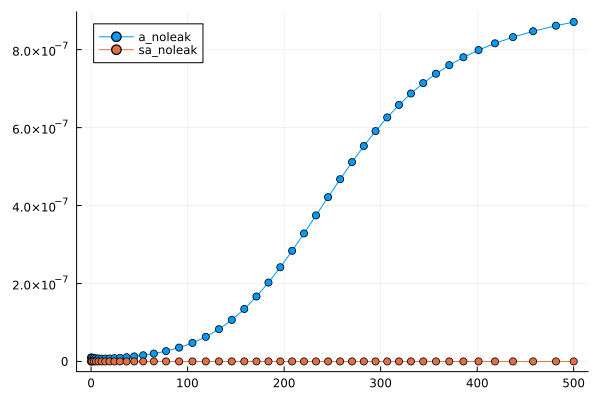

In [10]:
plot()
uni_dna_u0 = [
    1e-8, 1e-6, 0.0, 1e-6, 0, 1e-6, 0, 1e-6, 1e-5, 0, 0 
]
uni_dna_p = [6e4, 5e4, 0.0, 0.0]
tspan = (0, 500.0)

oprob = ODEProblem(uni_dna_rn, uni_dna_u0, tspan, uni_dna_p)
sol1 = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)

a_noleak = aggregate_values(uni_dna_rn, sol1, prefix="a")
sa_noleak = aggregate_values(uni_dna_rn, sol1, prefix="sa")
t1 = sol1.t

plot!(t1, [a_noleak, sa_noleak], labels=["a_noleak" "sa_noleak" ], shape=:circle, legend=:topleft)

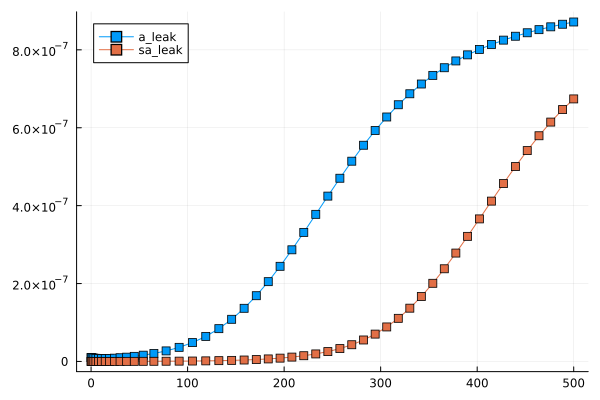

In [11]:
plot()
uni_dna_u0 = [
    1e-8, 1e-6, 0.0, 1e-6, 0, 1e-6, 0, 1e-6, 1e-5, 0, 0 
]
uni_dna_p = [6e4, 5e4, leak_rate, 0.0]
tspan = (0, 500.0)

oprob = ODEProblem(uni_dna_rn, uni_dna_u0, tspan, uni_dna_p)
sol2 = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)

a_leak = aggregate_values(uni_dna_rn, sol2, prefix="a")
sa_leak = aggregate_values(uni_dna_rn, sol2, prefix="sa")
t2 = sol2.t
plot!(t2, [a_leak, sa_leak], labels=["a_leak" "sa_leak" ], shape=:rect, legend=:topleft)

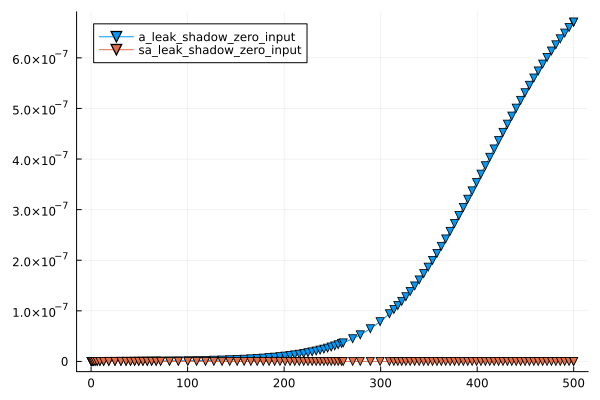

In [12]:
plot()
uni_dna_u0 = [
    0, 1e-6, 0.0, 1e-6, 0, 1e-6, 0, 1e-6, 1e-5, 0, 0 
]
uni_dna_p = [6e4, 5e4, leak_rate, 7e4]
tspan = (0, 500.0)

oprob = ODEProblem(uni_dna_rn, uni_dna_u0, tspan, uni_dna_p)
sol4 = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)

a_leak_shadow_zero_input = aggregate_values(uni_dna_rn, sol4, prefix="a")
sa_leak_shadow_zero_input = aggregate_values(uni_dna_rn, sol4, prefix="sa")
t4 = sol4.t
plot!(t4, [a_leak_shadow_zero_input, sa_leak_shadow_zero_input], labels=["a_leak_shadow_zero_input" "sa_leak_shadow_zero_input" ], shape=:dtriangle, legend=:topleft)

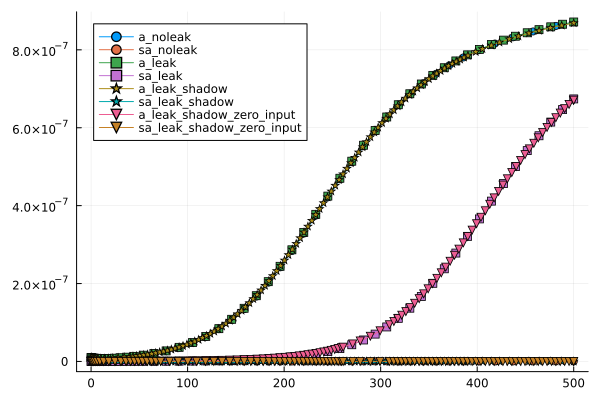

In [13]:
plot()
uni_dna_u0 = [
    1e-8, 1e-6, 0.0, 1e-6, 0, 1e-6, 0, 1e-6, 1e-5, 0, 0 
]
uni_dna_p = [6e4, 5e4, leak_rate, 8e4] # k1 k2 leak h
tspan = (0, 500.0)

oprob = ODEProblem(uni_dna_rn, uni_dna_u0, tspan, uni_dna_p)
sol3 = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)

a_leak_shadow = aggregate_values(uni_dna_rn, sol3, prefix="a")
sa_leak_shadow = aggregate_values(uni_dna_rn, sol3, prefix="sa")
t3 = sol3.t

plot!(t1, [a_noleak, sa_noleak], labels=["a_noleak" "sa_noleak" ], shape=:circle)
plot!(t2, [a_leak, sa_leak], labels=["a_leak" "sa_leak" ], shape=:rect)
plot!(t3, [a_leak_shadow, sa_leak_shadow], labels=["a_leak_shadow" "sa_leak_shadow" ], shape=:star5)
plot!(t4, [a_leak_shadow_zero_input, sa_leak_shadow_zero_input], labels=["a_leak_shadow_zero_input" "sa_leak_shadow_zero_input" ], 
shape=:dtriangle, legend=:topleft)


In [14]:
uni_dna_rn = @reaction_network uni begin
    k/infConc, x0 + gate_leaks_G_Iunix0 --> Iunix0
    infRate, Iunix0 + gate_leaks_G_x0_x1 --> x0 + x1
    k/infConc, x1 + gate_leaks_G_Iunix1 --> Iunix1
    infRate, Iunix1 + gate_leaks_G_x1_x2 --> x1 + x2
    k/infConc, x2 + gate_leaks_G_Iunix2 --> Iunix2
    infRate, Iunix2 + gate_leaks_G_x2_x0 --> x2 + x0
    buffer, 0 --> gate_leaks_G_Iunix0
    buffer, 0 --> gate_leaks_G_x0_x1
    buffer, 0 --> gate_leaks_G_Iunix1
    buffer, 0 --> gate_leaks_G_x1_x2
    buffer, 0 --> gate_leaks_G_Iunix2
    buffer, 0 --> gate_leaks_G_x2_x0
    
    k, a --> a + a
end k infConc infRate buffer
print_species_array(uni_dna_rn)

species = ['x0(t)','gate_leaks_G_Iunix0(t)','Iunix0(t)','gate_leaks_G_x0_x1(t)','x1(t)','gate_leaks_G_Iunix1(t)','Iunix1(t)','gate_leaks_G_x1_x2(t)','x2(t)','gate_leaks_G_Iunix2(t)','Iunix2(t)','gate_leaks_G_x2_x0(t)','a(t)',]

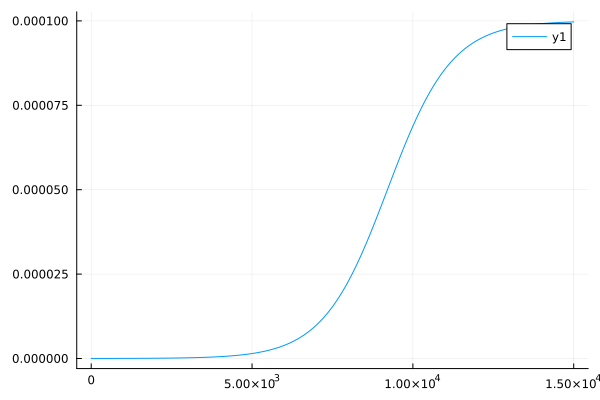

In [15]:
xinit = 1.0*BASE_CONC*BETA

uni_dna_u0 = [
xinit, INFCONC, 0.0, INFCONC, xinit, 
INFCONC, 0.0, INFCONC, xinit, INFCONC, 
0.0, INFCONC, xinit
]
uni_dna_p = [UNIMOL_K, INFCONC, INFRATE, 0]
tspan = (0, 15000.0)

oprob = ODEProblem(uni_dna_rn, uni_dna_u0, tspan, uni_dna_p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)

as1 = aggregate_values(uni_dna_rn, sol, prefix="a")
xs1 = aggregate_values(uni_dna_rn, sol, prefix="x")
xs1 = xs1/NCAT
t1 = sol.t
# plot(sol, vars=[2, 4])

plot(t1, [xs1])

### Using Values from Shadow Cancellation paper

In [16]:
uni_rn = @reaction_network begin
    1e-4, x0 + G_x0 --> x0 + x1 + G_x0_x0
    1e-4, x1 + G_x1 --> x1 + x0 + G_x1_x1
    1e-10, G_x0 --> x1 + G_x0L
    1e-10, G_x1 --> x0 + G_x1L
    
    shadow*1e-4, y0 + G_y0 --> y0 + y1 + G_y0_y0
    shadow*1e-4, y1 + G_y1 --> y1 + y0 + G_y1_y1
    shadow*1e-10, G_y0 --> y1 + G_y0L
    shadow*1e-10, G_y1 --> y0 + G_y1L
    
    shadow*100*1e-4, x0 + y0 + C0 --> waste
    shadow*100*1e-4, x1 + y1 + C1 --> waste
end shadow
species(uni_rn)

19-element Vector{Term{Real, Base.ImmutableDict{DataType, Any}}}:
 x0(t)
 G_x0(t)
 x1(t)
 G_x0_x0(t)
 G_x1(t)
 G_x1_x1(t)
 G_x0L(t)
 G_x1L(t)
 y0(t)
 G_y0(t)
 y1(t)
 G_y0_y0(t)
 G_y1(t)
 G_y1_y1(t)
 G_y0L(t)
 G_y1L(t)
 C0(t)
 waste(t)
 C1(t)

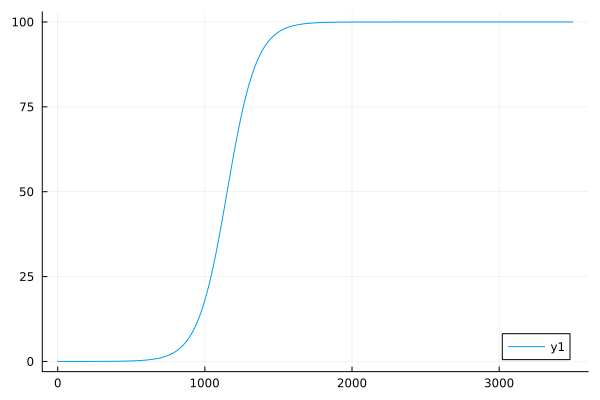

In [17]:
xinit = 1e-3
Cmax = 100

u0 = [
    xinit, Cmax, xinit, 0, Cmax, 0, 0, 0, 0, Cmax, 0, 0, Cmax, 0, 0, 0, Cmax, 0, Cmax
]
p = [1]
tspan = (0, 3500.0)

oprob = ODEProblem(uni_rn, u0, tspan, p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)

xs1 = aggregate_values(uni_rn, sol, prefix="x0")
t1 = sol.t
plot(t1, [xs1], legend=:bottomright)

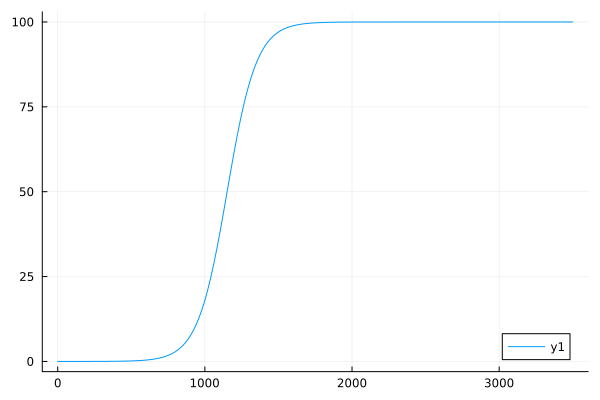

In [18]:
xinit = 1e-3
Cmax = 100

u0 = [
    xinit, Cmax, xinit, 0, Cmax, 0, 0, 0, 0, Cmax, 0, 0, Cmax, 0, 0, 0, Cmax, 0, Cmax
]
p = [0]
tspan = (0, 3500.0)

oprob = ODEProblem(uni_rn, u0, tspan, p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)

xs1 = aggregate_values(uni_rn, sol, prefix="x0")
t1 = sol.t
plot(t1, [xs1], legend=:bottomright)

# Bimolecular Catalytic Amplifier

### Ideal

In [16]:
bi_ideal_rn = @reaction_network bi_ideal_rn begin
    1.0, x + y --> y + y
end
species(bi_ideal_rn)

2-element Vector{Term{Real, Base.ImmutableDict{DataType, Any}}}:
 x(t)
 y(t)

In [17]:
bi_cat_rn = @reaction_network bi_cat_rn begin
    1.0, x0 + y0 --> y0 + y1
    1.0, x1 + y1 --> y1 + y2
    1.0, x2 + y2 --> y2 + y0
end
species(bi_cat_rn)

6-element Vector{Term{Real, Base.ImmutableDict{DataType, Any}}}:
 x0(t)
 y0(t)
 y1(t)
 x1(t)
 y2(t)
 x2(t)

In [18]:
plot()
ideal_u0 = [1.0, 1.0]
tspan = (0.0, 4.0) # Now this is in minutes, because k = 1?
ideal_p = []
ideal_ts, ideal_ys = simulation_results(bi_ideal_rn, ideal_u0, ideal_p, tspan=tspan, track_prefix="y")
ideal_ts, ideal_xs = simulation_results(bi_ideal_rn, ideal_u0, ideal_p, tspan=tspan, track_prefix="x")
cat_u0 = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
tspan = (0.0, 4.0)
cat_p = []
cat_ts, cat_ys = simulation_results(bi_cat_rn, cat_u0, cat_p, tspan=tspan, track_prefix="y")
cat_ts, cat_xs = simulation_results(bi_cat_rn, cat_u0, cat_p, tspan=tspan, track_prefix="x")

cat_ys /= NCAT
cat_xs /= NCAT

plot!([ideal_ts, ideal_ts, cat_ts, cat_ts], 
    [ideal_ys, ideal_xs, cat_ys, cat_xs], 
    labels=["ideal.Y" "ideal.X" "cat.Y" "cat.X"], 
    markershapes=[:none :none :auto :auto], 
    markersizes=[0 0 1 1])

In [19]:
function get_vars(u0; base_conc=BASE_CONC)
    vars = []
    for i in 1:length(u0)
        if u0[i] == base_conc
            push!(vars, i)
        end
    end
#     println(vars)
    return vars
end

get_vars (generic function with 1 method)

In [20]:
bi_dna_rn = @reaction_network bi_dna_rn begin
    linkerInfRate, y0 + gate_L_y0 --> linker_y0
    linkerInfRate, linker_y0 + gate_L_linker_y0 --> y0
    bimolRate, x0 + linker_y0 --> Ibix0y0
    infRate, Ibix0y0 + gate_leaks_G_y0_y1 --> y0 + y1
    linkerInfRate, y1 + gate_L_y1 --> linker_y1
    linkerInfRate, linker_y1 + gate_L_linker_y1 --> y1
    bimolRate, x1 + linker_y1 --> Ibix1y1
    infRate, Ibix1y1 + gate_leaks_G_y1_y2 --> y1 + y2
    linkerInfRate, y2 + gate_L_y2 --> linker_y2
    linkerInfRate, linker_y2 + gate_L_linker_y2 --> y2
    bimolRate, x2 + linker_y2 --> Ibix2y2
    infRate, Ibix2y2 + gate_leaks_G_y2_y0 --> y2 + y0

end linkerInfRate bimolRate infRate

print_species_array(bi_dna_rn)

species = ['y0(t)','gate_L_y0(t)','linker_y0(t)','gate_L_linker_y0(t)','x0(t)','Ibix0y0(t)','gate_leaks_G_y0_y1(t)','y1(t)','gate_L_y1(t)','linker_y1(t)','gate_L_linker_y1(t)','x1(t)','Ibix1y1(t)','gate_leaks_G_y1_y2(t)','y2(t)','gate_L_y2(t)','linker_y2(t)','gate_L_linker_y2(t)','x2(t)','Ibix2y2(t)','gate_leaks_G_y2_y0(t)',]

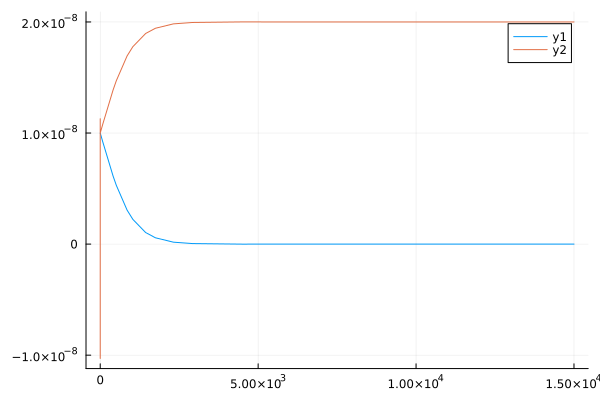

In [21]:
plot()

xinit = 1.0*BASE_CONC*BETA
yinit = 1.0*BASE_CONC*BETA

tspan=(0,15000.0)
leak_rate = 1e-5

bi_dna_u0 = [
yinit, INFCONC, 0.0, INFCONC, xinit, 
0.0, INFCONC, yinit, INFCONC, 0.0, 
INFCONC, xinit, 0.0, INFCONC, yinit, 
INFCONC, 0.0, INFCONC, xinit, 0.0, 
INFCONC, 
]

bi_dna_p = [LINKER_RATE, BIMOL_K, INFRATE]


oprob = ODEProblem(bi_dna_rn, bi_dna_u0, tspan, bi_dna_p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-8, abstol=1e-8)

ys1 = aggregate_values(bi_dna_rn, sol, prefix="y")
lys1 = aggregate_values(bi_dna_rn, sol, prefix="linker_y")
xs1 = aggregate_values(bi_dna_rn, sol, prefix="x")
xs1 = xs1/NCAT

yst1 = (ys1 + lys1)/NCAT
t1 = sol.t

plot!([t1, t1], [xs1, yst1])

# Lotka-Volterra Oscillator

## Ideal

In [22]:
lv_oscillator_ideal_rn = @reaction_network lv_oscillator_ideal begin
    k, x + y --> y + y
    k, x --> x + x
    k, y --> 0
end k
species(lv_oscillator_ideal_rn)

2-element Vector{Term{Real, Base.ImmutableDict{DataType, Any}}}:
 x(t)
 y(t)

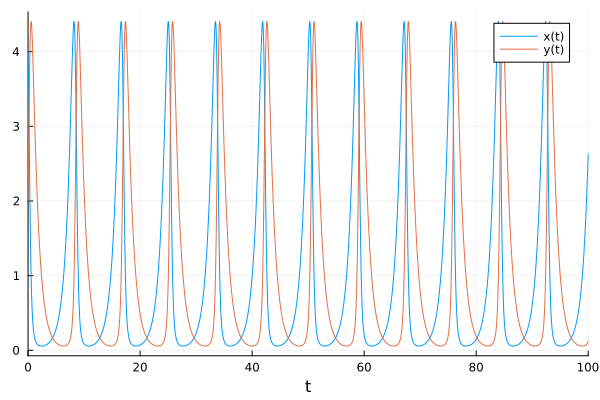

In [23]:
plot()
lv_oscillator_ideal_u0 = [4.0, 2.0]
tspan = (0.0, 100.0) # Now this is in minutes, because k = 1?
lv_oscillator_ideal_p = [1.0]
oprob = ODEProblem(lv_oscillator_ideal_rn, lv_oscillator_ideal_u0, tspan, lv_oscillator_ideal_p)
sol = solve(oprob, Tsit5(), reltol=1e-8, abstol=1e-8)
plot(sol)

## Catalytic

In [24]:
lv_oscillator_cat_rn = @reaction_network lv_oscillator_cat begin
    k, x0 + y0 --> y0 + y1
    k, x1 + y1 --> y1 + y2
    k, x2 + y2 --> y2 + y0
    k, x0 --> x0 + x1
    k, x1 --> x1 + x2
    k, x2 --> x2 + x0
    k, y0 --> 0
    k, y1 --> 0
    k, y2 --> 0
end k
species(lv_oscillator_cat_rn)

6-element Vector{Term{Real, Base.ImmutableDict{DataType, Any}}}:
 x0(t)
 y0(t)
 y1(t)
 x1(t)
 y2(t)
 x2(t)

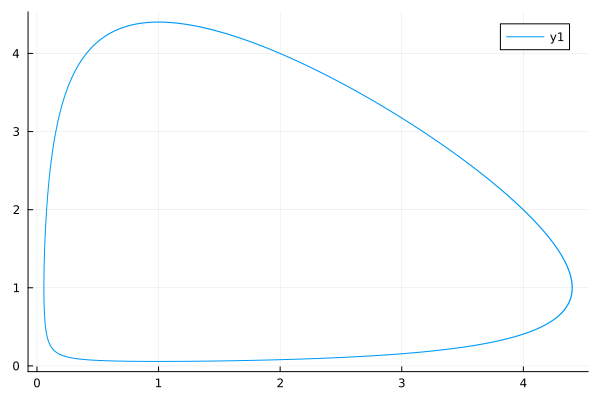

In [25]:
plot()
lv_oscillator_cat_u0 = [4.0, 2.0, 2.0, 4.0, 2.0, 4.0]
tspan = (0.0, 1000.0) # Now this is in minutes, because k = 1?
lv_oscillator_cat_p = [1.0]
oprob = ODEProblem(lv_oscillator_cat_rn, lv_oscillator_cat_u0, tspan, lv_oscillator_cat_p)
sol = solve(oprob, Tsit5(), reltol=1e-8, abstol=1e-8)
ys1 = aggregate_values(lv_oscillator_cat_rn, sol, prefix="y")
lys1 = aggregate_values(lv_oscillator_cat_rn, sol, prefix="linker_y")
xs1 = aggregate_values(lv_oscillator_cat_rn, sol, prefix="x")
xs1 = xs1/NCAT
yst1 = (ys1 + lys1)/NCAT
plot(xs1, yst1)

## DNA (No Leak No Shadow)

In [26]:
lv_oscillator_dna_rn = @reaction_network lv_oscillator_dna_rn begin
    linkerInfRate, y0 + gate_L_y0 --> linker_y0
    linkerInfRate, linker_y0 + gate_L_linker_y0 --> y0
    bimolRate, x0 + linker_y0 --> Ibix0y0
    infRate, Ibix0y0 + gate_leaks_G_y0_y1 --> y0 + y1
    linkerInfRate, y1 + gate_L_y1 --> linker_y1
    linkerInfRate, linker_y1 + gate_L_linker_y1 --> y1
    bimolRate, x1 + linker_y1 --> Ibix1y1
    infRate, Ibix1y1 + gate_leaks_G_y1_y2 --> y1 + y2
    linkerInfRate, y2 + gate_L_y2 --> linker_y2
    linkerInfRate, linker_y2 + gate_L_linker_y2 --> y2
    bimolRate, x2 + linker_y2 --> Ibix2y2
    infRate, Ibix2y2 + gate_leaks_G_y2_y0 --> y2 + y0
    k/infConc, x0 + gate_leaks_G_Iunix0 --> Iunix0
    infRate, Iunix0 + gate_leaks_G_x0_x1 --> x0 + x1
    k/infConc, x1 + gate_leaks_G_Iunix1 --> Iunix1
    infRate, Iunix1 + gate_leaks_G_x1_x2 --> x1 + x2
    k/infConc, x2 + gate_leaks_G_Iunix2 --> Iunix2
    infRate, Iunix2 + gate_leaks_G_x2_x0 --> x2 + x0
    2*k/infConc, y0 + gate_leaks_W_y0_0 --> 0
    2*k/infConc, y1 + gate_leaks_W_y1_0 --> 0
    2*k/infConc, y2 + gate_leaks_W_y2_0 --> 0

    
end linkerInfRate bimolRate infRate k infConc
print_species_array(lv_oscillator_dna_rn)

species = ['y0(t)','gate_L_y0(t)','linker_y0(t)','gate_L_linker_y0(t)','x0(t)','Ibix0y0(t)','gate_leaks_G_y0_y1(t)','y1(t)','gate_L_y1(t)','linker_y1(t)','gate_L_linker_y1(t)','x1(t)','Ibix1y1(t)','gate_leaks_G_y1_y2(t)','y2(t)','gate_L_y2(t)','linker_y2(t)','gate_L_linker_y2(t)','x2(t)','Ibix2y2(t)','gate_leaks_G_y2_y0(t)','gate_leaks_G_Iunix0(t)','Iunix0(t)','gate_leaks_G_x0_x1(t)','gate_leaks_G_Iunix1(t)','Iunix1(t)','gate_leaks_G_x1_x2(t)','gate_leaks_G_Iunix2(t)','Iunix2(t)','gate_leaks_G_x2_x0(t)','gate_leaks_W_y0_0(t)','gate_leaks_W_y1_0(t)','gate_leaks_W_y2_0(t)',]

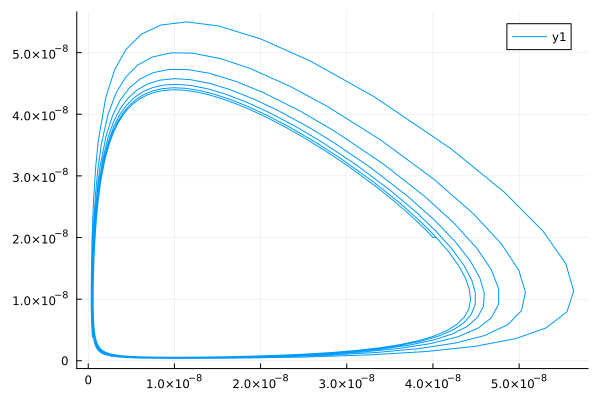

In [27]:
plot()

xinit = 4.0*BASE_CONC*BETA
yinit = 2.0*BASE_RATE*BETA

lvo_dna_u0 = [
yinit, INFCONC, 0.0, INFCONC, xinit, 
0.0, INFCONC, yinit, INFCONC, 0.0, 
INFCONC, xinit, 0.0, INFCONC, yinit, 
INFCONC, 0.0, INFCONC, xinit, 0.0, 
INFCONC, INFCONC, 0.0, INFCONC, INFCONC, 
0.0, INFCONC, INFCONC, 0.0, INFCONC, 
INFCONC, INFCONC, INFCONC 
]

# lvo_dna_p = [1e3/1e5, 1.0, 1e5, 1e5]
lvo_dna_p = [LINKER_RATE, 2*ALPHA/BETA*BASE_RATE, INFRATE, UNIMOL_K, INFCONC]

tspan = (0, 55000.0)

oprob = ODEProblem(lv_oscillator_dna_rn, lvo_dna_u0, tspan, lvo_dna_p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-10, abstol=1e-10)

ys1 = aggregate_values(lv_oscillator_dna_rn, sol, prefix="y")
lys1 = aggregate_values(lv_oscillator_dna_rn, sol, prefix="linker_y")
xs1 = aggregate_values(lv_oscillator_dna_rn, sol, prefix="x")
xs1 = xs1/NCAT
a = aggregate_values(lv_oscillator_dna_rn, sol, prefix="a")
b = aggregate_values(lv_oscillator_dna_rn, sol, prefix="b")
yst1 = (ys1 + lys1)/NCAT
t1 = sol.t
# plot!([t1, t1], [xs1, yst1], labels=["X" "Y"])
plot(xs1, yst1)

# Lotka-Volterra (Scaled to DNA implementation)

In [28]:
lv_oscillator_dna_rn = @reaction_network lv_oscillator_dna_rn begin
    linkerInfRate, y0 + gate_L_y0 --> linker_y0
    linkerInfRate, linker_y0 + gate_L_linker_y0 --> y0
    bimolRate, x0 + linker_y0 --> Ibix0y0
    infRate, Ibix0y0 + gate_leaks_G_y0_y1 --> y0 + y1
    linkerInfRate, y1 + gate_L_y1 --> linker_y1
    linkerInfRate, linker_y1 + gate_L_linker_y1 --> y1
    bimolRate, x1 + linker_y1 --> Ibix1y1
    infRate, Ibix1y1 + gate_leaks_G_y1_y2 --> y1 + y2
    linkerInfRate, y2 + gate_L_y2 --> linker_y2
    linkerInfRate, linker_y2 + gate_L_linker_y2 --> y2
    bimolRate, x2 + linker_y2 --> Ibix2y2
    infRate, Ibix2y2 + gate_leaks_G_y2_y0 --> y2 + y0
    k/infConc, x0 + gate_leaks_G_Iunix0 --> Iunix0
    infRate, Iunix0 + gate_leaks_G_x0_x1 --> x0 + x1
    k/infConc, x1 + gate_leaks_G_Iunix1 --> Iunix1
    infRate, Iunix1 + gate_leaks_G_x1_x2 --> x1 + x2
    k/infConc, x2 + gate_leaks_G_Iunix2 --> Iunix2
    infRate, Iunix2 + gate_leaks_G_x2_x0 --> x2 + x0
    2*k/infConc, y0 + gate_leaks_W_y0_0 --> 0
    2*k/infConc, y1 + gate_leaks_W_y1_0 --> 0
    2*k/infConc, y2 + gate_leaks_W_y2_0 --> 0
    buffer, 0 --> gate_L_y0
    buffer, 0 --> gate_L_y1
    buffer, 0 --> gate_L_y2
    buffer, 0 --> gate_L_linker_y0
    buffer, 0 --> gate_L_linker_y1
    buffer, 0 --> gate_L_linker_y2

    
end linkerInfRate bimolRate infRate k infConc buffer
print_species_array(lv_oscillator_dna_rn)

species = ['y0(t)','gate_L_y0(t)','linker_y0(t)','gate_L_linker_y0(t)','x0(t)','Ibix0y0(t)','gate_leaks_G_y0_y1(t)','y1(t)','gate_L_y1(t)','linker_y1(t)','gate_L_linker_y1(t)','x1(t)','Ibix1y1(t)','gate_leaks_G_y1_y2(t)','y2(t)','gate_L_y2(t)','linker_y2(t)','gate_L_linker_y2(t)','x2(t)','Ibix2y2(t)','gate_leaks_G_y2_y0(t)','gate_leaks_G_Iunix0(t)','Iunix0(t)','gate_leaks_G_x0_x1(t)','gate_leaks_G_Iunix1(t)','Iunix1(t)','gate_leaks_G_x1_x2(t)','gate_leaks_G_Iunix2(t)','Iunix2(t)','gate_leaks_G_x2_x0(t)','gate_leaks_W_y0_0(t)','gate_leaks_W_y1_0(t)','gate_leaks_W_y2_0(t)',]

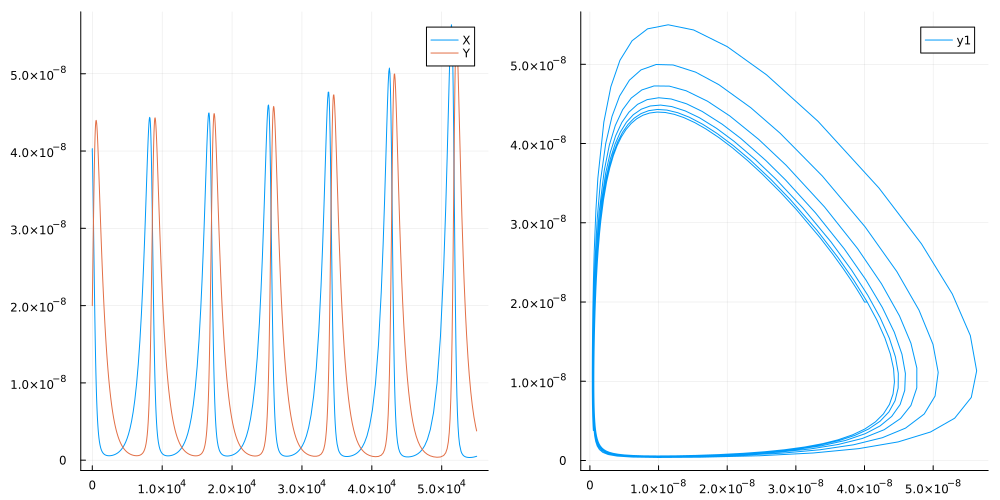

In [29]:
plot()

xinit = 4.0*BETA
yinit = 2.0*BETA


lvo_dna_u0 = [
yinit, INFCONC, 0.0, INFCONC, xinit, 
0.0, INFCONC, yinit, INFCONC, 0.0, 
INFCONC, xinit, 0.0, INFCONC, yinit, 
INFCONC, 0.0, INFCONC, xinit, 0.0, 
INFCONC, INFCONC, 0.0, INFCONC, INFCONC, 
0.0, INFCONC, INFCONC, 0.0, INFCONC, 
INFCONC, INFCONC, INFCONC 
]

lvo_dna_p = [LINKER_RATE, 2*ALPHA/BETA*BASE_RATE, INFRATE, ALPHA*BASE_RATE, INFCONC, 0]

tspan = (0, 55000.0)

oprob = ODEProblem(lv_oscillator_dna_rn, lvo_dna_u0, tspan, lvo_dna_p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-10, abstol=1e-10)

ys1 = aggregate_values(lv_oscillator_dna_rn, sol, prefix="y")
lys1 = aggregate_values(lv_oscillator_dna_rn, sol, prefix="linker_y")
xs1 = aggregate_values(lv_oscillator_dna_rn, sol, prefix="x")
xs1 = xs1/NCAT
a = aggregate_values(lv_oscillator_dna_rn, sol, prefix="a")
b = aggregate_values(lv_oscillator_dna_rn, sol, prefix="b")
yst1 = (ys1 + lys1)/NCAT
t1 = sol.t
p1 = plot([t1, t1], [xs1, yst1], labels=["X" "Y"])
p2 = plot(xs1, yst1)
plot(p1, p2, layout=(1, 2), size=(1000, 500))

## Buffering helps, slightly~

The plot below shows the LV oscillator run for the same time as the above picture but the oscillations sustain for a slightly more time than when there is `buffering`.

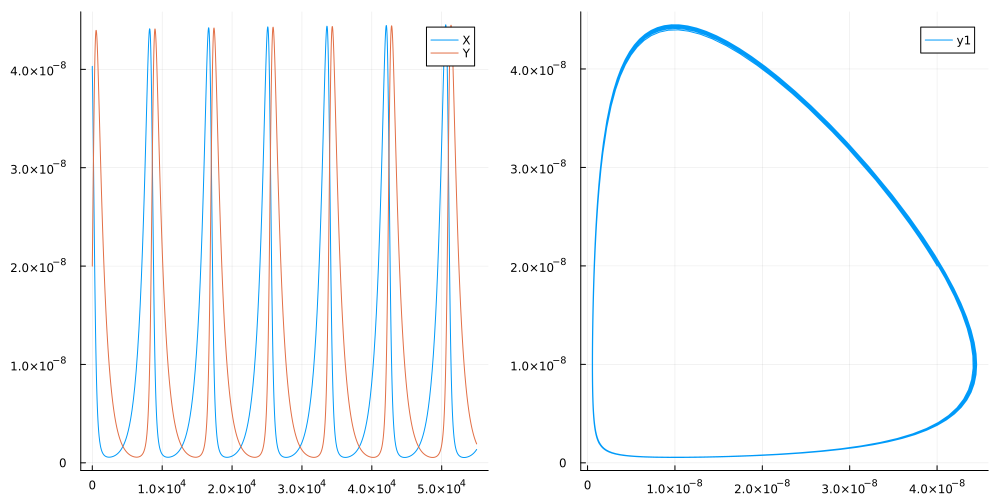

In [30]:
plot()
lvo_dna_p = [LINKER_RATE, 2*ALPHA/BETA*BASE_RATE, INFRATE, ALPHA*BASE_RATE, INFCONC, 1e-8]

tspan = (0, 55000.0)

oprob = ODEProblem(lv_oscillator_dna_rn, lvo_dna_u0, tspan, lvo_dna_p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-10, abstol=1e-10)

ysbuff = aggregate_values(lv_oscillator_dna_rn, sol, prefix="y")
lysbuff = aggregate_values(lv_oscillator_dna_rn, sol, prefix="linker_y")
xsbuff = aggregate_values(lv_oscillator_dna_rn, sol, prefix="x")
xsbuff = xsbuff/NCAT

ystbuff = (ysbuff + lysbuff)/NCAT
tbuff = sol.t
p1buff = plot([tbuff, tbuff], [xsbuff, ystbuff], labels=["X" "Y"])
p2buff = plot(xsbuff, ystbuff)
plot(p1buff, p2buff, layout=(1, 2), size=(1000, 500))

## LV Oscillator (Leaking, Shadow)

In [66]:
lv_dna_leaking_noshadow_rn = @reaction_network begin
    linkerInfRate, y0 + gate_L_y0 --> linker_y0
    shadow*linkerInfRate, shadow_y0 + shadow_gate_L_y0 --> shadow_linker_y0
    leak*shadow*infRate, y0 + shadow_y0 --> 0
    linkerInfRate, linker_y0 + gate_L_linker_y0 --> y0
    shadow*linkerInfRate, shadow_linker_y0 + shadow_gate_L_linker_y0 --> shadow_y0
    bimolRate, x0 + linker_y0 --> Ibix0y0
    shadow*bimolRate, shadow_x0 + shadow_linker_y0 --> shadow_Ibix0y0
    leak*shadow*infRate, x0 + shadow_x0 --> 0
    leak*shadow*infRate, Ibix0y0 + shadow_Ibix0y0 --> 0
    infRate, Ibix0y0 + gate_leaks_G_y0_y1 --> y0 + y1
    shadow*infRate, shadow_Ibix0y0 + shadow_gate_leaks_G_y0_y1 --> shadow_y0 + shadow_y1
    leak*leak_rate, gate_leaks_G_y0_y1 --> y0 + y1
    shadow*leak*leak_rate, shadow_gate_leaks_G_y0_y1 --> shadow_y0 + shadow_y1
    leak*shadow*infRate, y1 + shadow_y1 --> 0
    linkerInfRate, y1 + gate_L_y1 --> linker_y1
    shadow*linkerInfRate, shadow_y1 + shadow_gate_L_y1 --> shadow_linker_y1
    linkerInfRate, linker_y1 + gate_L_linker_y1 --> y1
    shadow*linkerInfRate, shadow_linker_y1 + shadow_gate_L_linker_y1 --> shadow_y1
    bimolRate, x1 + linker_y1 --> Ibix1y1
    shadow*bimolRate, shadow_x1 + shadow_linker_y1 --> shadow_Ibix1y1
    leak*shadow*infRate, Ibix1y1 + shadow_Ibix1y1 --> 0
    leak*shadow*infRate, x1 + shadow_x1 --> 0
    infRate, Ibix1y1 + gate_leaks_G_y1_y2 --> y1 + y2
    shadow*infRate, shadow_Ibix1y1 + shadow_gate_leaks_G_y1_y2 --> shadow_y1 + shadow_y2
    leak*leak_rate, gate_leaks_G_y1_y2 --> y1 + y2
    shadow*leak*leak_rate, shadow_gate_leaks_G_y1_y2 --> shadow_y1 + shadow_y2
    leak*shadow*infRate, y2 + shadow_y2 --> 0
    linkerInfRate, y2 + gate_L_y2 --> linker_y2
    shadow*linkerInfRate, shadow_y2 + shadow_gate_L_y2 --> shadow_linker_y2
    linkerInfRate, linker_y2 + gate_L_linker_y2 --> y2
    shadow*linkerInfRate, shadow_linker_y2 + shadow_gate_L_linker_y2 --> shadow_y2
    bimolRate, x2 + linker_y2 --> Ibix2y2
    shadow*bimolRate, shadow_x2 + shadow_linker_y2 --> shadow_Ibix2y2
    leak*shadow*infRate, Ibix2y2 + shadow_Ibix2y2 --> 0
    leak*shadow*infRate, x2 + shadow_x2 --> 0
    infRate, Ibix2y2 + gate_leaks_G_y2_y0 --> y2 + y0
    shadow*infRate, shadow_Ibix2y2 + shadow_gate_leaks_G_y2_y0 --> shadow_y2 + shadow_y0
    leak*leak_rate, gate_leaks_G_y2_y0 --> y2 + y0
    shadow*leak*leak_rate, shadow_gate_leaks_G_y2_y0 --> shadow_y2 + shadow_y0
    k/infConc, x0 + gate_leaks_G_Iunix0 --> Iunix0
    shadow*k/infConc, shadow_x0 + shadow_gate_leaks_G_Iunix0 --> shadow_Iunix0
    leak*leak_rate, gate_leaks_G_Iunix0 --> Iunix0
    shadow*leak*leak_rate, shadow_gate_leaks_G_Iunix0 --> shadow_Iunix0
    leak*shadow*infRate, Iunix0 + shadow_Iunix0 --> 0
    infRate, Iunix0 + gate_leaks_G_x0_x1 --> x0 + x1
    shadow*infRate, shadow_Iunix0 + shadow_gate_leaks_G_x0_x1 --> shadow_x0 + shadow_x1
    leak*leak_rate, gate_leaks_G_x0_x1 --> x0 + x1
    shadow*leak*leak_rate, shadow_gate_leaks_G_x0_x1 --> shadow_x0 + shadow_x1
    k/infConc, x1 + gate_leaks_G_Iunix1 --> Iunix1
    shadow*k/infConc, shadow_x1 + shadow_gate_leaks_G_Iunix1 --> shadow_Iunix1
    leak*leak_rate, gate_leaks_G_Iunix1 --> Iunix1
    shadow*leak*leak_rate, shadow_gate_leaks_G_Iunix1 --> shadow_Iunix1
    leak*shadow*infRate, Iunix1 + shadow_Iunix1 --> 0
    infRate, Iunix1 + gate_leaks_G_x1_x2 --> x1 + x2
    shadow*infRate, shadow_Iunix1 + shadow_gate_leaks_G_x1_x2 --> shadow_x1 + shadow_x2
    leak*leak_rate, gate_leaks_G_x1_x2 --> x1 + x2
    shadow*leak*leak_rate, shadow_gate_leaks_G_x1_x2 --> shadow_x1 + shadow_x2
    k/infConc, x2 + gate_leaks_G_Iunix2 --> Iunix2
    shadow*k/infConc, shadow_x2 + shadow_gate_leaks_G_Iunix2 --> shadow_Iunix2
    leak*leak_rate, gate_leaks_G_Iunix2 --> Iunix2
    shadow*leak*leak_rate, shadow_gate_leaks_G_Iunix2 --> shadow_Iunix2
    leak*shadow*infRate, Iunix2 + shadow_Iunix2 --> 0
    infRate, Iunix2 + gate_leaks_G_x2_x0 --> x2 + x0
    shadow*infRate, shadow_Iunix2 + shadow_gate_leaks_G_x2_x0 --> shadow_x2 + shadow_x0
    leak*leak_rate, gate_leaks_G_x2_x0 --> x2 + x0
    shadow*leak*leak_rate, shadow_gate_leaks_G_x2_x0 --> shadow_x2 + shadow_x0
    2*k/infConc, y0 + gate_leaks_W_y0_0 --> 0
    shadow*2*k/infConc, shadow_y0 + shadow_gate_leaks_W_y0_0 --> 0
    leak*leak_rate, gate_leaks_W_y0_0 --> y0
    shadow*leak*leak_rate, shadow_gate_leaks_W_y0_0 --> shadow_y0
    2*k/infConc, y1 + gate_leaks_W_y1_0 --> 0
    shadow*2*k/infConc, shadow_y1 + shadow_gate_leaks_W_y1_0 --> 0
    leak*leak_rate, gate_leaks_W_y1_0 --> y1
    shadow*leak*leak_rate, shadow_gate_leaks_W_y1_0 --> shadow_y1
    2*k/infConc, y2 + gate_leaks_W_y2_0 --> 0
    shadow*2*k/infConc, shadow_y2 + shadow_gate_leaks_W_y2_0 --> 0
    leak*leak_rate, gate_leaks_W_y2_0 --> y2
    shadow*leak*leak_rate, shadow_gate_leaks_W_y2_0 --> shadow_y2
end linkerInfRate bimolRate infRate k infConc leak leak_rate shadow

print_species_array(lv_dna_leaking_noshadow_rn)

species = ['y0(t)','gate_L_y0(t)','linker_y0(t)','shadow_y0(t)','shadow_gate_L_y0(t)','shadow_linker_y0(t)','gate_L_linker_y0(t)','shadow_gate_L_linker_y0(t)','x0(t)','Ibix0y0(t)','shadow_x0(t)','shadow_Ibix0y0(t)','gate_leaks_G_y0_y1(t)','y1(t)','shadow_gate_leaks_G_y0_y1(t)','shadow_y1(t)','gate_L_y1(t)','linker_y1(t)','shadow_gate_L_y1(t)','shadow_linker_y1(t)','gate_L_linker_y1(t)','shadow_gate_L_linker_y1(t)','x1(t)','Ibix1y1(t)','shadow_x1(t)','shadow_Ibix1y1(t)','gate_leaks_G_y1_y2(t)','y2(t)','shadow_gate_leaks_G_y1_y2(t)','shadow_y2(t)','gate_L_y2(t)','linker_y2(t)','shadow_gate_L_y2(t)','shadow_linker_y2(t)','gate_L_linker_y2(t)','shadow_gate_L_linker_y2(t)','x2(t)','Ibix2y2(t)','shadow_x2(t)','shadow_Ibix2y2(t)','gate_leaks_G_y2_y0(t)','shadow_gate_leaks_G_y2_y0(t)','gate_leaks_G_Iunix0(t)','Iunix0(t)','shadow_gate_leaks_G_Iunix0(t)','shadow_Iunix0(t)','gate_leaks_G_x0_x1(t)','shadow_gate_leaks_G_x0_x1(t)','gate_leaks_G_Iunix1(t)','Iunix1(t)','shadow_gate_leaks_G_Iunix1(t)',

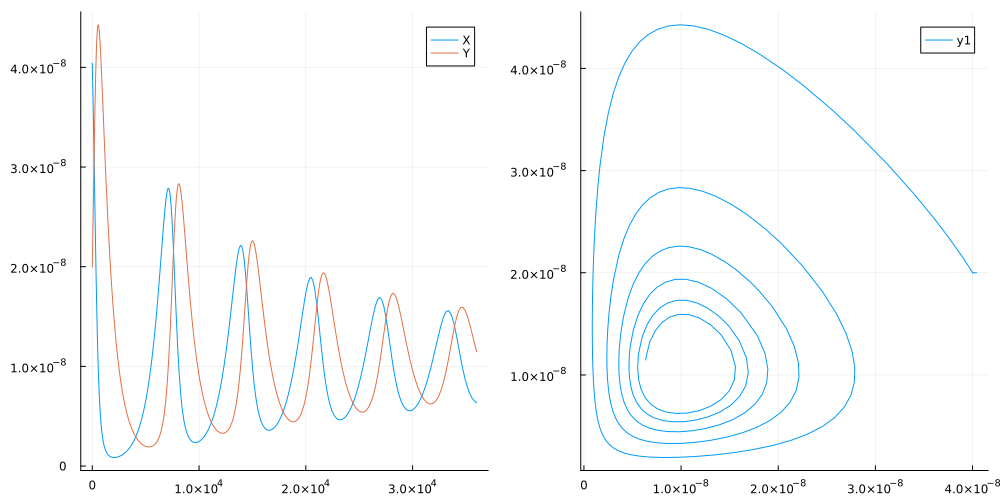

In [67]:
plot()

# Initialize variables
xinit = 4.0*BASE_CONC*BETA
yinit = 2.0*BASE_RATE*BETA

# Leak and Shadow flags
leak_flag = 1.0
shadow_flag = 0.0
LEAK_RATE = 1e-6*ALPHA

# end time
end_time = 3600*10 # seconds


lvo_dna_u0 = [
yinit, INFCONC, 0.0, 0.0, INFCONC, 
0.0, INFCONC, INFCONC, xinit, 0.0, 
0.0, 0.0, INFCONC, yinit, INFCONC, 
0.0, INFCONC, 0.0, INFCONC, 0.0, 
INFCONC, INFCONC, xinit, 0.0, 0.0, 
0.0, INFCONC, yinit, INFCONC, 0.0, 
INFCONC, 0.0, INFCONC, 0.0, INFCONC, 
INFCONC, xinit, 0.0, 0.0, 0.0, 
INFCONC, INFCONC, INFCONC, 0.0, INFCONC, 
0.0, INFCONC, INFCONC, INFCONC, 0.0, 
INFCONC, 0.0, INFCONC, INFCONC, INFCONC, 
0.0, INFCONC, 0.0, INFCONC, INFCONC, 
INFCONC, INFCONC, INFCONC, INFCONC, INFCONC, 
INFCONC, 
]


lvo_dna_p = [LINKER_RATE, 2*ALPHA/BETA*BASE_RATE, INFRATE, UNIMOL_K, INFCONC, leak_flag, LEAK_RATE, shadow_flag]

tspan = (0, end_time)

oprob = ODEProblem(lv_dna_leaking_noshadow_rn, lvo_dna_u0, tspan, lvo_dna_p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-10, abstol=1e-10)

ys1 = aggregate_values(lv_dna_leaking_noshadow_rn, sol, prefix="y")
lys1 = aggregate_values(lv_dna_leaking_noshadow_rn, sol, prefix="linker_y")
xs1 = aggregate_values(lv_dna_leaking_noshadow_rn, sol, prefix="x")
xs1 = xs1/NCAT
a = aggregate_values(lv_dna_leaking_noshadow_rn, sol, prefix="a")
b = aggregate_values(lv_dna_leaking_noshadow_rn, sol, prefix="b")
yst1 = (ys1 + lys1)/NCAT
t1 = sol.t
p1 = plot!([t1, t1], [xs1, yst1], labels=["X" "Y"])
p2 = plot(xs1, yst1)
plot(p1, p2, layout=(1, 2), size=(1000, 500))

## Lotka-Volterra Pure DSD Based

In [34]:
lv_dna_pure_dsd_rn = @reaction_network begin
    # x1 + x2 --> 2x2
    q1, x1 + L1 --> H1 + B1
    qmax, B1 + H1 --> x1 + L1
    qmax, x2 + H1 --> o1
    qmax, o1 + T1 --> x2 + x2 
    qs2, x2 + LS2 --> HS2 + BS2
    qmax, BS2 + HS2 --> x2 + LS2
    # x1 --> 2x1
    q2, x1 + G2 --> o2
    qmax, o2 + T2 --> x1 + x1
    # x2 --> 0
    q3, x2 + G3 --> o3
    qmax, o3 + T3 --> 0
end q1 q2 q3 qmax qs2 
species(lv_dna_pure_dsd_rn), length(species(lv_dna_pure_dsd_rn))

(Term{Real, Base.ImmutableDict{DataType, Any}}[x1(t), L1(t), H1(t), B1(t), x2(t), o1(t), T1(t), LS2(t), HS2(t), BS2(t), G2(t), o2(t), T2(t), G3(t), o3(t), T3(t)], 16)

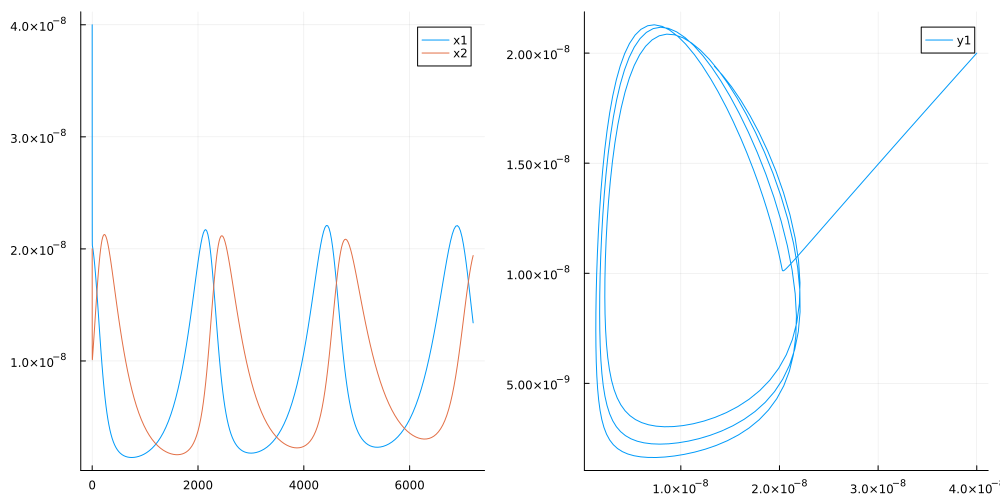

In [35]:
plot()
gamma_inv = 2
x1init = gamma_inv*20e-9 # 20nM
x2init = gamma_inv*10e-9 # 10nM
Cmax = 1e-6 # 10uM
k1 = 5e5
k2 = 1/300
k3 = 1/300
q1 = gamma_inv*k1
q2 = gamma_inv*k2/Cmax
q3 = gamma_inv*k3/Cmax
qs2 = gamma_inv*k1
qmax = 1e6

u0 = [x1init, Cmax, 0, Cmax, x2init, 0, Cmax, Cmax, 0, Cmax, Cmax, 0, Cmax, Cmax, 0, Cmax]
p = [q1, q2, q3, qmax, qs2]
tspan = (0, 7200)
oprob = ODEProblem(lv_dna_pure_dsd_rn, u0, tspan, p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)

x1plot = aggregate_values(lv_dna_pure_dsd_rn, sol, prefix="x1")
x2plot = aggregate_values(lv_dna_pure_dsd_rn, sol, prefix="x2")
t1 = sol.t
p1 = plot([t1, t1], [x1plot, x2plot], labels=["x1" "x2"])
p2 = plot(x1plot, x2plot)
plot(p1, p2, layout=(1, 2), size=(1000, 500))


## Lotka-Volterra Pure DSD (Leaky)

In [36]:
lv_dna_pure_dsd_leaky_rn = @reaction_network begin
    # x1 + x2 --> 2x2
    q1, x1 + L1 --> H1 + B1 # no need for B1 leak as it is already present
    leak*leak_rate, L1 --> o1 
    qmax, B1 + H1 --> x1 + L1
    leak*leak_rate, H1 --> x1
    qmax, x2 + H1 --> o1
    leak*leak_rate, H1 --> o1
    qmax, o1 + T1 --> x2 + x2
    leak*leak_rate, T1 --> x2 + x2
    qs2, x2 + LS2 --> HS2 + BS2 # No need to leak BS2 as it is already present
    qmax, BS2 + HS2 --> x2 + LS2
    leak*leak_rate, HS2 --> x2 
    # x1 --> 2x1
    q2, x1 + G2 --> o2
    leak*leak_rate, G2 --> o2
    qmax, o2 + T2 --> x1 + x1
    leak*leak_rate, T2 --> x1 + x1
    # x2 --> 0
    q3, x2 + G3 --> o3
    leak*leak_rate, G3 --> o3
    qmax, o3 + T3 --> 0
    leak*leak_rate, so3 + sT3 --> 0
    
end q1 q2 q3 qmax qs2 leak leak_rate
species(lv_dna_pure_dsd_leaky_rn), length(species(lv_dna_pure_dsd_leaky_rn))

(Term{Real, Base.ImmutableDict{DataType, Any}}[x1(t), L1(t), H1(t), B1(t), o1(t), x2(t), T1(t), LS2(t), HS2(t), BS2(t), G2(t), o2(t), T2(t), G3(t), o3(t), T3(t), so3(t), sT3(t)], 18)

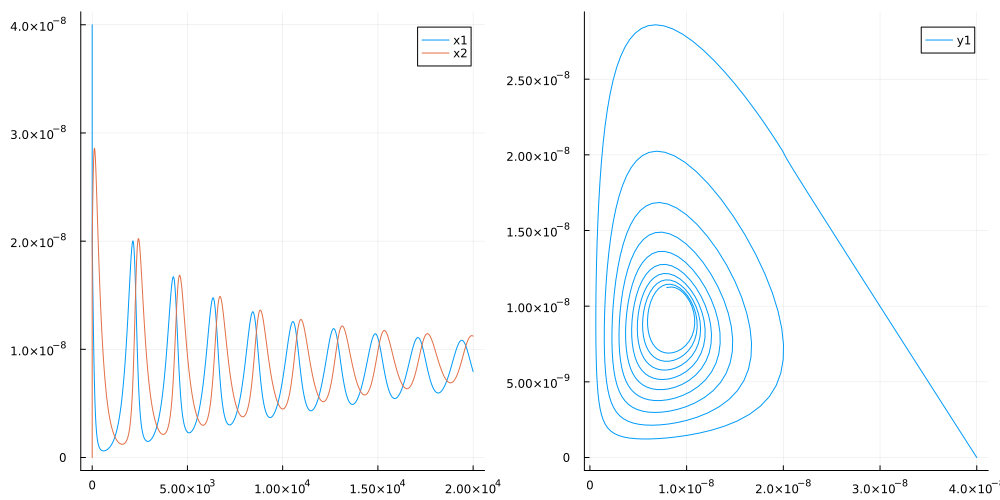

In [37]:
plot()
gamma_inv = 2
x1init = gamma_inv*20e-9 # 20nM
x2init = gamma_inv*10e-9 # 10nM
Cmax = 3e-6 # 10uM
k1 = 5e5
k2 = 1/300
k3 = 1/300
q1 = gamma_inv*k1
q2 = gamma_inv*k2/Cmax
q3 = gamma_inv*k3/Cmax
qs2 = gamma_inv*k1
qmax = 1e6
leak = 1
leak_rate = 1e-7

u0 = [x1init, Cmax, 0, Cmax, x2init, 0, Cmax, Cmax, 0, Cmax, Cmax, 0, Cmax, Cmax, 0, Cmax, 0, Cmax]
p = [q1, q2, q3, qmax, qs2, leak, leak_rate]
tspan = (0, 20000)
oprob = ODEProblem(lv_dna_pure_dsd_leaky_rn, u0, tspan, p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)

x1plot = aggregate_values(lv_dna_pure_dsd_leaky_rn, sol, prefix="x1")
x2plot = aggregate_values(lv_dna_pure_dsd_leaky_rn, sol, prefix="x2")
t1 = sol.t
p1 = plot([t1, t1], [x1plot, x2plot], labels=["x1" "x2"])
p2 = plot(x1plot, x2plot)
plot(p1, p2, layout=(1, 2), size=(1000, 500))

## Lotka-Volterra Pure DSD (Leaky + Shadow)

In [38]:
lv_dna_pure_dsd_leaky_shadow_rn = @reaction_network begin
    # x1 + x2 --> 2x2
    q1, x1 + L1 --> H1 + B1 # no need for B1 leak as it is already present
    shadow*q1, sx1 + sL1 --> sH1 + sB1 # no need for B1 leak as it is already present
    
    leak*leak_rate, L1 --> o1
    shadow*leak*leak_rate, sL1 --> so1
    qmax, B1 + H1 --> x1 + L1
    shadow*qmax, sB1 + sH1 --> sx1 + sL1
    leak*leak_rate, H1 --> x1
    shadow*leak*leak_rate, sH1 --> sx1
    qmax, x2 + H1 --> o1
    shadow*qmax, sx2 + sH1 --> so1
    leak*leak_rate, H1 --> o1
    shadow*leak*leak_rate, sH1 --> so1
    qmax, o1 + T1 --> x2 + x2
    shadow*qmax, so1 + sT1 --> sx2 + sx2
    leak*leak_rate, T1 --> x2 + x2
    shadow*leak*leak_rate, sT1 --> sx2 + sx2
    qs2, x2 + LS2 --> HS2 + BS2 # No need to leak BS2 as it is already present
    shadow*qs2, sx2 + sLS2 --> sHS2 + sBS2 # No need to leak BS2 as it is already present
    qmax, BS2 + HS2 --> x2 + LS2
    shadow*qmax, sBS2 + sHS2 --> sx2 + sLS2
    leak*leak_rate, HS2 --> x2 
    shadow*leak*leak_rate, sHS2 --> sx2 
    # x1 --> 2x1
    q2, x1 + G2 --> o2
    shadow*q2, sx1 + sG2 --> so2
    leak*leak_rate, G2 --> o2
    shadow*leak*leak_rate, sG2 --> so2
    qmax, o2 + T2 --> x1 + x1
    shadow*qmax, so2 + sT2 --> sx1 + sx1
    leak*leak_rate, T2 --> x1 + x1
    shadow*leak*leak_rate, sT2 --> sx1 + sx1
    # x2 --> 0
    q3, x2 + G3 --> o3
    shadow*q3, sx2 + sG3 --> so3
    leak*leak_rate, G3 --> o3
    shadow*leak*leak_rate, sG3 --> so3
    
    # Annihilation
    shadow*leak*annih, x1 + sx1 --> 0
    shadow*leak*annih, x2 + sx2 --> 0
    shadow*leak*annih, o1 + so1 --> 0
    shadow*leak*annih, o2 + so2 --> 0
    shadow*leak*annih, o3 + so3 --> 0
end q1 q2 q3 qmax qs2 leak leak_rate shadow annih
sps = species(lv_dna_pure_dsd_leaky_shadow_rn)
for sp in sps
    print(sp)
    print(" ")
end

x1(t) L1(t) H1(t) B1(t) sx1(t) sL1(t) sH1(t) sB1(t) o1(t) so1(t) x2(t) sx2(t) T1(t) sT1(t) LS2(t) HS2(t) BS2(t) sLS2(t) sHS2(t) sBS2(t) G2(t) o2(t) sG2(t) so2(t) T2(t) sT2(t) G3(t) o3(t) sG3(t) so3(t) 

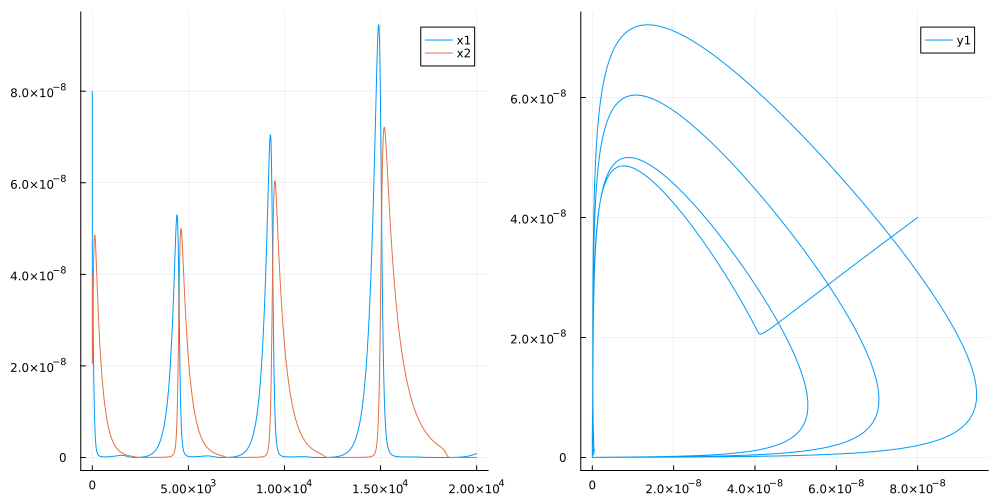

In [39]:
plot()
gamma_inv = 2
x1init = gamma_inv*40e-9 # 20nM
x2init = gamma_inv*20e-9 # 10nM
Cmax = 1000e-9 # 1000 nM
k1 = 5e5
k2 = 1/300
k3 = 1/300
q1 = gamma_inv*k1
q2 = gamma_inv*k2/Cmax
q3 = gamma_inv*k3/Cmax
qs2 = gamma_inv*k1
qmax = 1e6
leak = 1
leak_rate = 1e-7
shadow = 1
annih = 1e6 # TODO (How to set annihilation reactions!)

# x1(t) L1(t) H1(t) B1(t) sx1(t) sL1(t) sH1(t) 
# sB1(t) o1(t) so1(t) x2(t) sx2(t) T1(t) sT1(t) 
# LS2(t) HS2(t) BS2(t) sLS2(t) sHS2(t) sBS2(t) 
# G2(t) o2(t) sG2(t) so2(t) T2(t) sT2(t) G3(t) 
# o3(t) sG3(t) so3(t) 

u0 = [x1init, Cmax, 0, Cmax, 0, Cmax, 0, 
      Cmax, 0, 0, x2init, 0, Cmax, Cmax, 
      Cmax, 0, Cmax, Cmax, 0, Cmax, 
      Cmax, 0, Cmax, 0, Cmax, Cmax, Cmax, 
      0, Cmax, 0]

p = [q1, q2, q3, qmax, qs2, leak, leak_rate, shadow, annih]
tspan = (0, 20000)
oprob = ODEProblem(lv_dna_pure_dsd_leaky_shadow_rn, u0, tspan, p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)

x1plot = aggregate_values(lv_dna_pure_dsd_leaky_shadow_rn, sol, prefix="x1")
x2plot = aggregate_values(lv_dna_pure_dsd_leaky_shadow_rn, sol, prefix="x2")
t1 = sol.t
p1 = plot([t1, t1], [x1plot, x2plot], labels=["x1" "x2"])
p2 = plot(x1plot, x2plot)
plot(p1, p2, layout=(1, 2), size=(1000, 500))

## Consensus CRN

In [40]:
consensus_rn = @reaction_network begin
    1, a + b --> y + y
    1, a + y --> a + a
    1, b + y --> b + b
end
species(consensus_rn)

3-element Vector{Term{Real, Base.ImmutableDict{DataType, Any}}}:
 a(t)
 b(t)
 y(t)

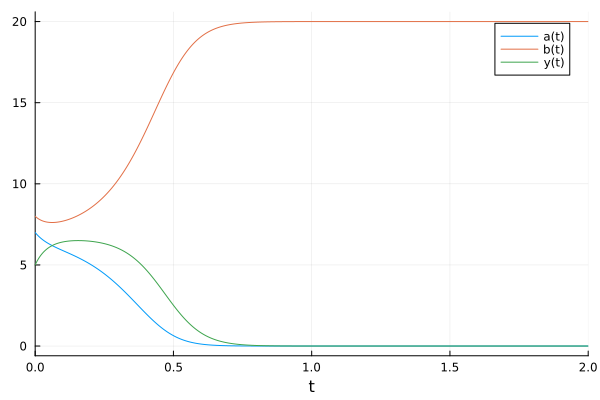

In [41]:
plot()
ainit = 7
binit = 8
yinit = 5


u0 = [ainit, binit, yinit]
p = []
tspan = (0, 2)
oprob = ODEProblem(consensus_rn, u0, tspan, p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)
plot(sol)

## Consensus Pure DSD (Leak = no, Shadow = no)

In [42]:
consensus_dsd_rn = @reaction_network begin
    q1, a + gate_L_a_b --> buffer_H_a_b_leaks_a + BSbiab
    qmax, BSbiab + buffer_H_a_b_leaks_a --> a + gate_L_a_b
    qmax, b + buffer_H_a_b_leaks_a --> Ibiab
    qmax, Ibiab + gate_T_a_b_leaks_y_y --> y + y
    q2, a + gate_L_a_y --> buffer_H_a_y_leaks_a + BSbiay
    qmax, BSbiay + buffer_H_a_y_leaks_a --> a + gate_L_a_y
    qmax, y + buffer_H_a_y_leaks_a --> Ibiay
    qmax, Ibiay + gate_T_a_y_leaks_a_a --> a + a
    q3, b + gate_L_b_y --> buffer_H_b_y_leaks_b + BSbiby
    qmax, BSbiby + buffer_H_b_y_leaks_b --> b + gate_L_b_y
    qmax, y + buffer_H_b_y_leaks_b --> Ibiby
    qmax, Ibiby + gate_T_b_y_leaks_b_b --> b + b
    
    # Additional buffering to adjust
    qsb, b + gate_LS_b --> buffer_HS_b_leaks_b + BSbib
    qmax, buffer_HS_b_leaks_b + BSbib --> b + gate_LS_b
    
    qsy, y + gate_LS_y --> buffer_HS_y_leaks_y + BSbiy
    qmax, buffer_HS_y_leaks_y + BSbiy --> y + gate_LS_y
    
end q1 q2 q3 qmax qsb qsy
print_species_array(consensus_dsd_rn)

species = ['a(t)','gate_L_a_b(t)','buffer_H_a_b_leaks_a(t)','BSbiab(t)','b(t)','Ibiab(t)','gate_T_a_b_leaks_y_y(t)','y(t)','gate_L_a_y(t)','buffer_H_a_y_leaks_a(t)','BSbiay(t)','Ibiay(t)','gate_T_a_y_leaks_a_a(t)','gate_L_b_y(t)','buffer_H_b_y_leaks_b(t)','BSbiby(t)','Ibiby(t)','gate_T_b_y_leaks_b_b(t)','gate_LS_b(t)','buffer_HS_b_leaks_b(t)','BSbib(t)','gate_LS_y(t)','buffer_HS_y_leaks_y(t)','BSbiy(t)',]

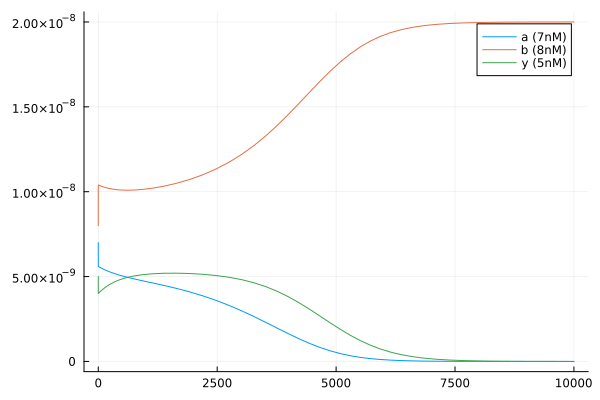

In [43]:
plot()

qmax = 1e6 # /M sec
k = 1e5 # scaled. 1/(1e3*1e-8)

sigma = 2*k # sigma_a = 2k, sigma_b = k, sigma_y = 0
sigma_a = 2*k
sigma_b = k
sigma_y = 0

gamma_inv = qmax/(qmax-sigma) # 1e6/(8*1e5) = 5/4
q1 = gamma_inv*k
q2 = gamma_inv*k
q3 = gamma_inv*k
qsb = gamma_inv*k
qsy = gamma_inv*2*k

ainit = gamma_inv*7*1e-9
binit = gamma_inv*8*1e-9
yinit = gamma_inv*5*1e-9

Cmax = 10e-6 # 10uM


u0 = [
ainit, Cmax, 0.0, Cmax, binit, 
0.0, Cmax, yinit, Cmax, 0.0, 
Cmax, 0.0, Cmax, Cmax, 0.0, 
Cmax, 0.0, Cmax, Cmax, 0.0, 
Cmax, Cmax, 0.0, Cmax, 
]

p = [q1, q2, q3, qmax, qsb, qsy]

tspan = (0, 10000)
oprob = ODEProblem(consensus_dsd_rn, u0, tspan, p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)
aplot = aggregate_values(consensus_dsd_rn, sol, prefix="a")/gamma_inv
bplot = aggregate_values(consensus_dsd_rn, sol, prefix="b")/gamma_inv
yplot = aggregate_values(consensus_dsd_rn, sol, prefix="y")/gamma_inv
t = sol.t
plot([t, t, t], [aplot, bplot, yplot], labels=["a (7nM)" "b (8nM)" "y (5nM)"])
# bsbib = aggregate_values(consensus_dsd_rn, sol, prefix="BSbib")
# plot(bsbib)

## Consensus Pure DSD (Leaks = Yes, Shadow= No)

In [44]:
consensus_dsd_leaky_rn = @reaction_network begin
    q1, a + gate_L_a_b --> buffer_H_a_b_leaks_a + BSbiab
    qmax, BSbiab + buffer_H_a_b_leaks_a --> a + gate_L_a_b
    leak*leak_rate, buffer_H_a_b_leaks_a --> a
    qmax, b + buffer_H_a_b_leaks_a --> Ibiab
    qmax, Ibiab + gate_T_a_b_leaks_y_y --> y + y
    leak*leak_rate, gate_T_a_b_leaks_y_y --> y + y
    q2, a + gate_L_a_y --> buffer_H_a_y_leaks_a + BSbiay
    qmax, BSbiay + buffer_H_a_y_leaks_a --> a + gate_L_a_y
    leak*leak_rate, buffer_H_a_y_leaks_a --> a
    qmax, y + buffer_H_a_y_leaks_a --> Ibiay
    qmax, Ibiay + gate_T_a_y_leaks_a_a --> a + a
    leak*leak_rate, gate_T_a_y_leaks_a_a --> a + a
    q3, b + gate_L_b_y --> buffer_H_b_y_leaks_b + BSbiby
    qmax, BSbiby + buffer_H_b_y_leaks_b --> b + gate_L_b_y
    leak*leak_rate, buffer_H_b_y_leaks_b --> b
    qmax, y + buffer_H_b_y_leaks_b --> Ibiby
    qmax, Ibiby + gate_T_b_y_leaks_b_b --> b + b
    leak*leak_rate, gate_T_b_y_leaks_b_b --> b + b
    
    # Additional buffering to adjust
    qsb, b + gate_LS_b --> buffer_HS_b_leaks_b + BSbib
    qmax, buffer_HS_b_leaks_b + BSbib --> b + gate_LS_b
    
    qsy, y + gate_LS_y --> buffer_HS_y_leaks_y + BSbiy
    qmax, buffer_HS_y_leaks_y + BSbiy --> y + gate_LS_y
end q1 q2 q3 qmax qsb qsy leak leak_rate
print_species_array(consensus_dsd_leaky_rn)

species = ['a(t)','gate_L_a_b(t)','buffer_H_a_b_leaks_a(t)','BSbiab(t)','b(t)','Ibiab(t)','gate_T_a_b_leaks_y_y(t)','y(t)','gate_L_a_y(t)','buffer_H_a_y_leaks_a(t)','BSbiay(t)','Ibiay(t)','gate_T_a_y_leaks_a_a(t)','gate_L_b_y(t)','buffer_H_b_y_leaks_b(t)','BSbiby(t)','Ibiby(t)','gate_T_b_y_leaks_b_b(t)','gate_LS_b(t)','buffer_HS_b_leaks_b(t)','BSbib(t)','gate_LS_y(t)','buffer_HS_y_leaks_y(t)','BSbiy(t)',]

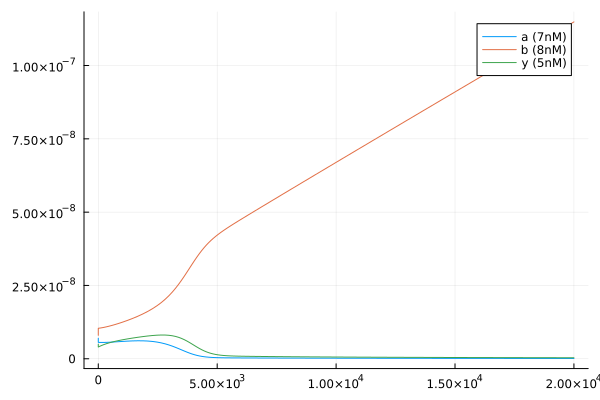

In [45]:
plot()

qmax = 1e6 # /M sec
k = 1e5 # scaled. 1/(1e3*1e-8)

sigma = 2*k # sigma_a = 2k, sigma_b = k, sigma_y = 0
sigma_a = 2*k
sigma_b = k
sigma_y = 0

gamma_inv = qmax/(qmax-sigma) # 1e6/(8*1e5) = 5/4
q1 = gamma_inv*k
q2 = gamma_inv*k
q3 = gamma_inv*k
qsb = gamma_inv*k
qsy = gamma_inv*2*k

ainit = gamma_inv*7*1e-9
binit = gamma_inv*8*1e-9
yinit = gamma_inv*5*1e-9

Cmax = 10e-6 # 10uM

leak = 1
leak_rate = 1e-7 


u0 = [
ainit, Cmax, 0.0, Cmax, binit, 
0.0, Cmax, yinit, Cmax, 0.0, 
Cmax, 0.0, Cmax, Cmax, 0.0, 
Cmax, 0.0, Cmax, Cmax, 0.0, 
Cmax, Cmax, 0.0, Cmax, 
]

p = [q1, q2, q3, qmax, qsb, qsy, leak, leak_rate]

tspan = (0, 20000)
oprob = ODEProblem(consensus_dsd_leaky_rn, u0, tspan, p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)
aplot = aggregate_values(consensus_dsd_leaky_rn, sol, prefix="a")/gamma_inv
bplot = aggregate_values(consensus_dsd_leaky_rn, sol, prefix="b")/gamma_inv
yplot = aggregate_values(consensus_dsd_leaky_rn, sol, prefix="y")/gamma_inv
t = sol.t
plot([t, t, t], [aplot, bplot, yplot], labels=["a (7nM)" "b (8nM)" "y (5nM)"])
# bsbib = aggregate_values(consensus_dsd_rn, sol, prefix="BSbib")
# plot(bsbib)

## Consensus Pure DSD (Leak = Yes, Shadow = Yes)

In [46]:
consensus_dsd_leaky_shadow_rn = @reaction_network begin
    q1, a + gate_L_a_b --> buffer_H_a_b_leaks_a + BSbiab
    shadow*q1, shadow_a + shadow_gate_L_a_b --> shadow_buffer_H_a_b_leaks_a + shadow_BSbiab
    leak*shadow*infRate, a + shadow_a --> 0
    qmax, BSbiab + buffer_H_a_b_leaks_a --> a + gate_L_a_b
    shadow*qmax, shadow_BSbiab + shadow_buffer_H_a_b_leaks_a --> shadow_a + shadow_gate_L_a_b
    leak*leak_rate, buffer_H_a_b_leaks_a --> a
    shadow*leak*leak_rate, shadow_buffer_H_a_b_leaks_a --> shadow_a
    qmax, b + buffer_H_a_b_leaks_a --> Ibiab
    shadow*qmax, shadow_b + shadow_buffer_H_a_b_leaks_a --> shadow_Ibiab
    leak*shadow*infRate, Ibiab + shadow_Ibiab --> 0
    leak*shadow*infRate, b + shadow_b --> 0
    qmax, Ibiab + gate_T_a_b_leaks_y_y --> y + y
    shadow*qmax, shadow_Ibiab + shadow_gate_T_a_b_leaks_y_y --> shadow_y + shadow_y
    leak*leak_rate, gate_T_a_b_leaks_y_y --> y + y
    shadow*leak*leak_rate, shadow_gate_T_a_b_leaks_y_y --> shadow_y + shadow_y
    leak*shadow*infRate, y + shadow_y --> 0
    q2, a + gate_L_a_y --> buffer_H_a_y_leaks_a + BSbiay
    shadow*q2, shadow_a + shadow_gate_L_a_y --> shadow_buffer_H_a_y_leaks_a + shadow_BSbiay
    qmax, BSbiay + buffer_H_a_y_leaks_a --> a + gate_L_a_y
    shadow*qmax, shadow_BSbiay + shadow_buffer_H_a_y_leaks_a --> shadow_a + shadow_gate_L_a_y
    leak*leak_rate, buffer_H_a_y_leaks_a --> a
    shadow*leak*leak_rate, shadow_buffer_H_a_y_leaks_a --> shadow_a
    qmax, y + buffer_H_a_y_leaks_a --> Ibiay
    shadow*qmax, shadow_y + shadow_buffer_H_a_y_leaks_a --> shadow_Ibiay
    leak*shadow*infRate, Ibiay + shadow_Ibiay --> 0
    qmax, Ibiay + gate_T_a_y_leaks_a_a --> a + a
    shadow*qmax, shadow_Ibiay + shadow_gate_T_a_y_leaks_a_a --> shadow_a + shadow_a
    leak*leak_rate, gate_T_a_y_leaks_a_a --> a + a
    shadow*leak*leak_rate, shadow_gate_T_a_y_leaks_a_a --> shadow_a + shadow_a
    q3, b + gate_L_b_y --> buffer_H_b_y_leaks_b + BSbiby
    shadow*q3, shadow_b + shadow_gate_L_b_y --> shadow_buffer_H_b_y_leaks_b + shadow_BSbiby
    qmax, BSbiby + buffer_H_b_y_leaks_b --> b + gate_L_b_y
    shadow*qmax, shadow_BSbiby + shadow_buffer_H_b_y_leaks_b --> shadow_b + shadow_gate_L_b_y
    leak*leak_rate, buffer_H_b_y_leaks_b --> b
    shadow*leak*leak_rate, shadow_buffer_H_b_y_leaks_b --> shadow_b
    qmax, y + buffer_H_b_y_leaks_b --> Ibiby
    shadow*qmax, shadow_y + shadow_buffer_H_b_y_leaks_b --> shadow_Ibiby
    leak*shadow*infRate, Ibiby + shadow_Ibiby --> 0
    qmax, Ibiby + gate_T_b_y_leaks_b_b --> b + b
    shadow*qmax, shadow_Ibiby + shadow_gate_T_b_y_leaks_b_b --> shadow_b + shadow_b
    leak*leak_rate, gate_T_b_y_leaks_b_b --> b + b
    shadow*leak*leak_rate, shadow_gate_T_b_y_leaks_b_b --> shadow_b + shadow_b
    
    # Additional buffering to adjust
    qsb, b + gate_LS_b --> buffer_HS_b_leaks_b + BSbib
    leak*shadow*qsb, shadow_b + shadow_gate_LS_b --> shadow_buffer_HS_b_leaks_b + shadow_BSbib
    qmax, buffer_HS_b_leaks_b + BSbib --> b + gate_LS_b
    leak*shadow*qmax, shadow_buffer_HS_b_leaks_b + shadow_BSbib --> shadow_b + shadow_gate_LS_b
    
    qsy, y + gate_LS_y --> buffer_HS_y_leaks_y + BSbiy
    qmax, buffer_HS_y_leaks_y + BSbiy --> y + gate_LS_y
    leak*shadow*qsy, shadow_y + shadow_gate_LS_y --> shadow_buffer_HS_y_leaks_y + shadow_BSbiy
    leak*shadow*qmax, shadow_buffer_HS_y_leaks_y + shadow_BSbiy --> shadow_y + shadow_gate_LS_y
    
end q1 q2 q3 qmax qsb qsy leak leak_rate shadow infRate

print_species_array(consensus_dsd_leaky_shadow_rn)

species = ['a(t)','gate_L_a_b(t)','buffer_H_a_b_leaks_a(t)','BSbiab(t)','shadow_a(t)','shadow_gate_L_a_b(t)','shadow_buffer_H_a_b_leaks_a(t)','shadow_BSbiab(t)','b(t)','Ibiab(t)','shadow_b(t)','shadow_Ibiab(t)','gate_T_a_b_leaks_y_y(t)','y(t)','shadow_gate_T_a_b_leaks_y_y(t)','shadow_y(t)','gate_L_a_y(t)','buffer_H_a_y_leaks_a(t)','BSbiay(t)','shadow_gate_L_a_y(t)','shadow_buffer_H_a_y_leaks_a(t)','shadow_BSbiay(t)','Ibiay(t)','shadow_Ibiay(t)','gate_T_a_y_leaks_a_a(t)','shadow_gate_T_a_y_leaks_a_a(t)','gate_L_b_y(t)','buffer_H_b_y_leaks_b(t)','BSbiby(t)','shadow_gate_L_b_y(t)','shadow_buffer_H_b_y_leaks_b(t)','shadow_BSbiby(t)','Ibiby(t)','shadow_Ibiby(t)','gate_T_b_y_leaks_b_b(t)','shadow_gate_T_b_y_leaks_b_b(t)','gate_LS_b(t)','buffer_HS_b_leaks_b(t)','BSbib(t)','shadow_gate_LS_b(t)','shadow_buffer_HS_b_leaks_b(t)','shadow_BSbib(t)','gate_LS_y(t)','buffer_HS_y_leaks_y(t)','BSbiy(t)','shadow_gate_LS_y(t)','shadow_buffer_HS_y_leaks_y(t)','shadow_BSbiy(t)',]

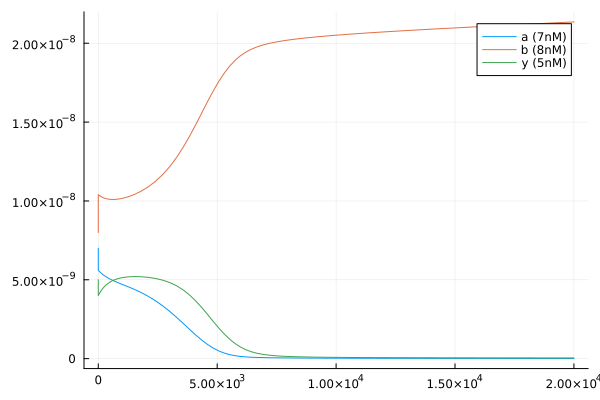

In [47]:
plot()

qmax = 1e6 # /M sec
k = 1e5 # scaled. 1/(1e3*1e-8)

sigma = 2*k # sigma_a = 2k, sigma_b = k, sigma_y = 0
sigma_a = 2*k
sigma_b = k
sigma_y = 0

gamma_inv = qmax/(qmax-sigma) # 1e6/(8*1e5) = 5/4
q1 = gamma_inv*k
q2 = gamma_inv*k
q3 = gamma_inv*k
qsb = gamma_inv*k
qsy = gamma_inv*2*k

ainit = gamma_inv*7*1e-9
binit = gamma_inv*8*1e-9
yinit = gamma_inv*5*1e-9

Cmax = 10e-6 # 10uM

leak = 1
shadow = 1
leak_rate = 1e-7 # TODO(rajiv) Is this leak rate justified?
infRate = 1e8

u0 = [
ainit, Cmax, 0.0, Cmax, 0.0, 
Cmax, 0.0, Cmax, binit, 0.0, 
0.0, 0.0, Cmax, yinit, Cmax, 
0.0, Cmax, 0.0, Cmax, Cmax, 
0.0, Cmax, 0.0, 0.0, Cmax, 
Cmax, Cmax, 0.0, Cmax, Cmax, 
0.0, Cmax, 0.0, 0.0, Cmax, 
Cmax, Cmax, 0.0, Cmax, Cmax, 
0.0, Cmax, Cmax, 0.0, Cmax, 
Cmax, 0.0, Cmax, 
]

p = [q1, q2, q3, qmax, qsb, qsy, leak, leak_rate, shadow, infRate]

tspan = (0, 20000)
oprob = ODEProblem(consensus_dsd_leaky_shadow_rn, u0, tspan, p)
sol = solve(oprob, AutoTsit5(Rosenbrock23()), reltol=1e-12, abstol=1e-12)
aplot = aggregate_values(consensus_dsd_leaky_shadow_rn, sol, prefix="a")/gamma_inv
bplot = aggregate_values(consensus_dsd_leaky_shadow_rn, sol, prefix="b")/gamma_inv
yplot = aggregate_values(consensus_dsd_leaky_shadow_rn, sol, prefix="y")/gamma_inv
t = sol.t
plot([t, t, t], [aplot, bplot, yplot], labels=["a (7nM)" "b (8nM)" "y (5nM)"])
